In [ ]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder

from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

In [3]:
df = pd.read_csv("conversion_data_train.csv")
df.head()

,country,age,new_user,source,total_pages_visited,converted
0,China,22,1,Direct,2,0
1,UK,21,1,Ads,3,0
2,Germany,20,0,Seo,14,1
3,US,23,1,Seo,3,0
4,US,28,1,Direct,3,0


### Graph

In [4]:
import plotly.express as px

df_num = df.select_dtypes(include="number")
fig = px.imshow(df_num.corr(), text_auto=True)
fig.show()

In [5]:
fig = px.box(df, x="age", color="source",facet_row="country")
fig.show()

In [6]:
fig = px.scatter(
    df,
    x="total_pages_visited",
    y="age",
    color="source",
    facet_col="country",
    facet_row="source"
)

fig.show()

In [7]:
fig = px.histogram(
    df,
    x="country",
    nbins=100,          # nombre de bins : plus élevé = plus précis
    title="aaa",
    labels={'aaaa':'aaaae', 'count':'aaa'}
)

fig.show()

In [8]:
fig = px.histogram(
    df,
    x="age",
    nbins=100,          # nombre de bins : plus élevé = plus précis
    title="aaa",
    labels={'aaaa':'aaaae', 'count':'aaa'}
)

fig.show()

In [9]:
fig = px.histogram(
    df,
    x="new_user",
    nbins=2,          # nombre de bins : plus élevé = plus précis
    title="aaa",
    labels={'aaaa':'aaaae', 'count':'aaa'}
)

fig.show()

In [10]:
fig = px.histogram(
    df,
    x="source",
    nbins=3,          # nombre de bins : plus élevé = plus précis
    title="aaa",
    labels={'aaaa':'aaaae', 'count':'aaa'}
)

fig.show()

In [11]:
fig = px.histogram(
    df,
    x="total_pages_visited",
    nbins=50,          # nombre de bins : plus élevé = plus précis
    title="aaa",
    labels={'aaaa':'aaaae', 'count':'aaa'}
)

fig.show()

In [12]:
fig = px.histogram(
    df,
    x="converted",
    nbins=2,          # nombre de bins : plus élevé = plus précis
    title="aaa",
    labels={'aaaa':'aaaae', 'count':'aaa'}
)

fig.show()

### ML Random forest

In [13]:
X = df.drop(columns=["converted"])
Y = df["converted"]

display(X.head())
display(Y.head())

,country,age,new_user,source,total_pages_visited
0,China,22,1,Direct,2
1,UK,21,1,Ads,3
2,Germany,20,0,Seo,14
3,US,23,1,Seo,3
4,US,28,1,Direct,3


0    0
1    0
2    1
3    0
4    0
Name: converted, dtype: int64

In [14]:
# First : always divide dataset into train set & test set !!
print("Dividing into train and test sets...")
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

print("...Done.")

Dividing into train and test sets...
...Done.


In [15]:
# Create pipeline for numeric features
numeric_features = ["age", "new_user","total_pages_visited"]  # Names of numeric columns in X_train/X_test
numeric_transformer = Pipeline(
    steps=[
        ("imputer",SimpleImputer(strategy="median"),),  # missing values will be replaced by columns' median
        ("scaler", StandardScaler()),
    ]
)

# Create pipeline for categorical features
categorical_features = ["source","country"]  # Names of categorical columns in X_train/X_test
categorical_transformer = Pipeline(
    steps=[
        ("imputer",SimpleImputer(strategy="most_frequent"),),  # missing values will be replaced by most frequent value
        ("encoder",OneHotEncoder(drop="first"),),  # first column will be dropped to avoid creating correlations between features
    ]
)

# Use ColumnTransformer to make a preprocessor object that describes all the treatments to be done
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numeric_features),
        ("cat", categorical_transformer, categorical_features),
    ]
)

In [16]:
# Preprocessings on train set
print(X_train)
X_train = preprocessor.fit_transform(X_train)
print(X_train[0:5])

       country  age  new_user  source  total_pages_visited
17050       US   29         1     Seo                    4
260342      US   23         0  Direct                    7
278164      UK   33         1     Seo                   11
268440   China   25         1     Seo                    5
157837      US   40         0     Seo                    1
...        ...  ...       ...     ...                  ...
211543      US   36         1     Ads                    4
86293       US   37         1     Seo                    5
122579      UK   31         1  Direct                    6
152315      UK   25         1     Seo                    5
117952      US   34         1     Ads                    3

[227664 rows x 5 columns]
[[-0.19030813  0.67687527 -0.26094223  0.          1.          0.
   0.          1.        ]
 [-0.9161838  -1.47737706  0.63598611  1.          0.          0.
   0.          1.        ]
 [ 0.29360899  0.67687527  1.83189056  0.          1.          0.
   1.        

In [17]:
# Preprocessings on test set
print(X_test.head())
X_test = preprocessor.transform(X_test)
print(X_test[0:5, :])

        country  age  new_user source  total_pages_visited
149371       US   20         1    Ads                    7
221325       US   31         1    Seo                    5
14016        US   28         0    Seo                    4
257982  Germany   25         1    Ads                    4
59983        US   44         0    Ads                    7
[[-1.27912164  0.67687527  0.63598611  0.          0.          0.
   0.          1.        ]
 [ 0.05165043  0.67687527  0.03803388  0.          1.          0.
   0.          1.        ]
 [-0.3112874  -1.47737706 -0.26094223  0.          1.          0.
   0.          1.        ]
 [-0.67422524  0.67687527 -0.26094223  0.          0.          1.
   0.          0.        ]
 [ 1.62438106 -1.47737706  0.63598611  0.          0.          0.
   0.          1.        ]]


In [18]:
model = RandomForestClassifier(
    n_estimators=100,       # nombre d’arbres
    random_state=0,         # pour reproductibilité
    max_depth=None,         # profondeur maximale, None = pas de limite
    class_weight='balanced' # si ton dataset est déséquilibré
)

# Entraîner le modèle
model.fit(X_train, Y_train)



,"n_estimators n_estimators: int, default=100The number of trees in the forest... versionchanged:: 0.22 The default value of ``n_estimators`` changed from 10 to 100 in 0.22.",100
,"criterion criterion: {""gini"", ""entropy"", ""log_loss""}, default=""gini""The function to measure the quality of a split. Supported criteria are""gini"" for the Gini impurity and ""log_loss"" and ""entropy"" both for theShannon information gain, see :ref:`tree_mathematical_formulation`.Note: This parameter is tree-specific.",'gini'
,"max_depth max_depth: int, default=NoneThe maximum depth of the tree. If None, then nodes are expanded untilall leaves are pure or until all leaves contain less thanmin_samples_split samples.",None
,"min_samples_split min_samples_split: int or float, default=2The minimum number of samples required to split an internal node:- If int, then consider `min_samples_split` as the minimum number.- If float, then `min_samples_split` is a fraction and `ceil(min_samples_split * n_samples)` are the minimum number of samples for each split... versionchanged:: 0.18 Added float values for fractions.",2
,"min_samples_leaf min_samples_leaf: int or float, default=1The minimum number of samples required to be at a leaf node.A split point at any depth will only be considered if it leaves atleast ``min_samples_leaf`` training samples in each of the left andright branches. This may have the effect of smoothing the model,especially in regression.- If int, then consider `min_samples_leaf` as the minimum number.- If float, then `min_samples_leaf` is a fraction and `ceil(min_samples_leaf * n_samples)` are the minimum number of samples for each node... versionchanged:: 0.18 Added float values for fractions.",1
,"min_weight_fraction_leaf min_weight_fraction_leaf: float, default=0.0The minimum weighted fraction of the sum total of weights (of allthe input samples) required to be at a leaf node. Samples haveequal weight when sample_weight is not provided.",0.0
,"max_features max_features: {""sqrt"", ""log2"", None}, int or float, default=""sqrt""The number of features to consider when looking for the best split:- If int, then consider `max_features` features at each split.- If float, then `max_features` is a fraction and `max(1, int(max_features * n_features_in_))` features are considered at each split.- If ""sqrt"", then `max_features=sqrt(n_features)`.- If ""log2"", then `max_features=log2(n_features)`.- If None, then `max_features=n_features`... versionchanged:: 1.1 The default of `max_features` changed from `""auto""` to `""sqrt""`.Note: the search for a split does not stop until at least onevalid partition of the node samples is found, even if it requires toeffectively inspect more than ``max_features`` features.",'sqrt'
,"max_leaf_nodes max_leaf_nodes: int, default=NoneGrow trees with ``max_leaf_nodes`` in best-first fashion.Best nodes are defined as relative reduction in impurity.If None then unlimited number of leaf nodes.",None
,"min_impurity_decrease min_impurity_decrease: float, default=0.0A node will be split if this split induces a decrease of the impuritygreater than or equal to this value.The weighted impurity decrease equation is the following:: N_t / N * (impurity - N_t_R / N_t * right_impurity - N_t_L / N_t * left_impurity)where ``N`` is the total number of samples, ``N_t`` is the number ofsamples at the current node, ``N_t_L`` is the number of samples in theleft child, and ``N_t_R`` is the number of samples in the right child.``N``, ``N_t``, ``N_t_R`` and ``N_t_L`` all refer to the weighted sum,if ``sample_weight`` is passed... versionadded:: 0.19",0.0
,"bootstrap bootstrap: bool, default=TrueWhether bootstrap samples are used when building trees. If False, thewhole dataset is used to build each tree.",True
,"oob_score oob_score: bool or callable, default=FalseWhether to use out-of-bag samples to estimate the generalization score.By default, :func:`~sklearn.metrics.accuracy_score` is used.Provide a callable with signature `metric

In [19]:
# Predictions on training set

Y_train_pred = model.predict(X_train)
print("...Done.")
print(Y_train_pred[0:5])

...Done.
[0 0 0 0 0]


In [20]:
# Predictions on test set

Y_test_pred = model.predict(X_test)
print("...Done.")
print(Y_test_pred[0:5])

...Done.
[0 0 0 0 0]


In [21]:
#Évaluation

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


def print_metrics(Y_true, Y_pred, dataset_name):
    print(f"===== {dataset_name} =====")
    print("Accuracy :", accuracy_score(Y_true, Y_pred))
    print("Precision:", precision_score(Y_true, Y_pred, zero_division=0))
    print("Recall   :", recall_score(Y_true, Y_pred, zero_division=0))
    print("F1-score :", f1_score(Y_true, Y_pred, zero_division=0))
    print()

print_metrics(Y_train, Y_train_pred, "TRAIN SET")
print_metrics(Y_test, Y_test_pred, "TEST SET")

===== TRAIN SET =====
Accuracy : 0.9660596317379999
Precision: 0.48606724222643366
Recall   : 0.9447476125511596
F1-score : 0.6418871946980581

===== TEST SET =====
Accuracy : 0.9612059877714527
Precision: 0.44775248102743725
Recall   : 0.8291891891891892
F1-score : 0.5815011372251706



C:\Users\Smith\AppData\Local\Temp\ipykernel_8620\2331456264.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




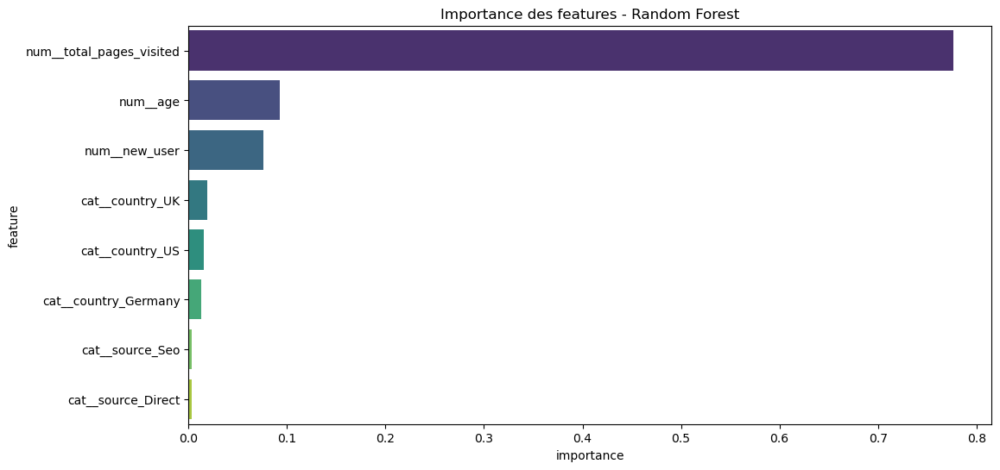

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


rf_model = model  # ou renommer ta Random Forest
feature_importances = rf_model.feature_importances_
feature_names = preprocessor.get_feature_names_out()

df_importances = pd.DataFrame({
    "feature": feature_names,
    "importance": feature_importances
}).sort_values(by="importance", ascending=False)

plt.figure(figsize=(12,6))
sns.barplot(x="importance", y="feature", data=df_importances, palette="viridis")
plt.title("Importance des features - Random Forest")
plt.show()



### Part 02

In [23]:
print_metrics(Y_test, Y_test_pred, "TEST SET - Baseline")


===== TEST SET - Baseline =====
Accuracy : 0.9612059877714527
Precision: 0.44775248102743725
Recall   : 0.8291891891891892
F1-score : 0.5815011372251706



In [24]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 10, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "class_weight": [None, "balanced"]
}


In [ ]:
grid = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    scoring="f1",
    cv=5,
    n_jobs=-1,
    verbose=2
)

grid.fit(X_train, Y_train)


c:\env\python\miniconda3\envs\jedha\Lib\site-packages\joblib\externals\loky\process_executor.py:782: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



In [ ]:
#param_grid = {
#    "n_estimators": [40],
#    "max_depth": [8],
#    "min_samples_split": [2],
#    "min_samples_leaf": [5],
#   "class_weight": [None, "balanced"]

In [ ]:
best_model = grid.best_estimator_

Y_test_pred_best = best_model.predict(X_test)
print_metrics(Y_test, Y_test_pred_best, "TEST SET - Optimisé")
